In [1]:
%pylab inline
import pandas as pd
import seaborn as sns
import pandas_profiling
import sklearn
import statsmodels.regression.linear_model as sm
from datetime import date, datetime

Populating the interactive namespace from numpy and matplotlib


C:\Users\Bhumihar Rakesh\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
missing_values = ["n/a", "na", "--",'?'] 
data=pd.read_excel("C:/Users/Bhumihar Rakesh/Desktop/Python/BankCaseStudy.xlsx",
                   sheet_name=1,header=0,na_values=missing_values)
data

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
0,1930-10-01,NaN,77053,86,HS-grad,9,Widowed,1,NaN,6,...,White,Female,0,4356,40,3.304241,10,United-States,defaulted,1968
1,1938-09-29,Private,132870,96,HS-grad,9,Widowed,1,7.0,5,...,White,Female,0,4356,18,12.487949,26,United-States,defaulted,8858
2,1954-09-25,NaN,186061,84,Some-college,10,Widowed,0,NaN,3,...,Black,Female,0,4356,40,7.548385,4,United-States,defaulted,471
3,1966-09-22,Private,140359,76,7th-8th,4,Divorced,4,6.0,4,...,White,Female,0,3900,40,6.163333,8,United-States,defaulted,6568
4,1979-09-19,Private,264663,72,Some-college,10,Separated,4,2.0,9,...,White,Female,0,3900,40,25.267700,21,United-States,defaulted,4118
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32556,1998-09-14,Private,310152,77,Some-college,10,Never-married,0,7.0,0,...,White,Male,0,0,40,5.492870,13,United-States,defaulted,1532
32557,1993-09-15,Private,257302,90,Assoc-acdm,12,Married-civ-spouse,4,6.0,9,...,White,Female,0,0,38,25.599217,23,United-States,defaulted,7106
32558,1980-09-18,Private,154374,64,HS-grad,9,Married-civ-spouse,2,1.0,5,...,White,Male,0,0,40,10.777267,14,United-States,not Defaulted,551
32559,1962-09-23,Private,151910,72,HS-grad,9,Widowed,5,1.0,9,...,White,Female,0,0,40,2.175752,26,United-States,defaulted,2122


In [3]:
data.head(15)

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
0,1930-10-01,NaN,77053,86,HS-grad,9,Widowed,1,NaN,6,...,White,Female,0,4356,40,3.304241,10,United-States,defaulted,1968
1,1938-09-29,Private,132870,96,HS-grad,9,Widowed,1,7.0,5,...,White,Female,0,4356,18,12.487949,26,United-States,defaulted,8858
2,1954-09-25,NaN,186061,84,Some-college,10,Widowed,0,NaN,3,...,Black,Female,0,4356,40,7.548385,4,United-States,defaulted,471
3,1966-09-22,Private,140359,76,7th-8th,4,Divorced,4,6.0,4,...,White,Female,0,3900,40,6.163333,8,United-States,defaulted,6568
4,1979-09-19,Private,264663,72,Some-college,10,Separated,4,2.0,9,...,White,Female,0,3900,40,25.267700,21,United-States,defaulted,4118
5,1986-09-17,Private,216864,69,HS-grad,9,Divorced,1,5.0,5,...,White,Female,0,3770,45,4.234085,14,United-States,defaulted,1433
6,1982-09-18,Private,150601,68,10th,6,Separated,3,4.0,8,...,White,Male,0,3770,40,16.246421,3,United-States,defaulted,9551
7,1946-09-27,State-gov,88638,75,Doctorate,16,Never-married,0,2.0,1,...,White,Female,0,3683,20,24.223107,5,United-States,not Defaulted,8309
8,1952-09-25,Federal-gov,422013,69,HS-grad,9,Divorced,4,6.0,6,...,White,Female,0,3683,40,5.101118,21,United-States,defaulted,6770
9,1979-09-19,Private,70037,89,Some-college,10,Never-married,0,6.0,1,...,White,Male,0,3004,60,14.380427,21,NaN,not Defaulted,9414


In [4]:
data.tail(10)

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
32551,1977-09-19,Self-emp-not-inc,27242,63,Some-college,10,Married-civ-spouse,1,5.0,3,...,White,Male,0,0,50,9.902995,15,United-States,defaulted,9743
32552,1988-09-16,Private,34066,76,10th,6,Married-civ-spouse,2,4.0,5,...,Amer-Indian-Eskimo,Male,0,0,40,41.467064,24,United-States,defaulted,7295
32553,1977-09-19,Private,84661,72,Assoc-voc,11,Married-civ-spouse,4,5.0,9,...,White,Male,0,0,45,7.877017,5,United-States,defaulted,570
32554,1988-09-16,Private,116138,87,Masters,14,Never-married,0,2.0,1,...,Asian-Pac-Islander,Male,0,0,11,23.762667,11,Taiwan,defaulted,1987
32555,1967-09-22,Private,321865,62,Masters,14,Married-civ-spouse,1,3.0,3,...,White,Male,0,0,40,1.941703,22,United-States,not Defaulted,2421
32556,1998-09-14,Private,310152,77,Some-college,10,Never-married,0,7.0,0,...,White,Male,0,0,40,5.492870,13,United-States,defaulted,1532
32557,1993-09-15,Private,257302,90,Assoc-acdm,12,Married-civ-spouse,4,6.0,9,...,White,Female,0,0,38,25.599217,23,United-States,defaulted,7106
32558,1980-09-18,Private,154374,64,HS-grad,9,Married-civ-spouse,2,1.0,5,...,White,Male,0,0,40,10.777267,14,United-States,not Defaulted,551
32559,1962-09-23,Private,151910,72,HS-grad,9,Widowed,5,1.0,9,...,White,Female,0,0,40,2.175752,26,United-States,defaulted,2122
32560,1998-09-14,Private,201490,87,HS-grad,9,Never-married,0,7.0,2,...,White,Male,0,0,20,25.381131,11,United-States,defaulted,8855


In [5]:
#data.keys()
data.columns

Index(['Date of Birth', 'Sector where person works', 'fnlwgt',
       'Weight of Person', 'education', 'Total years in study ( in years )',
       'marital.status', 'Childrens', 'Job changed ( how many times)',
       'No of dependent ', 'occupation', 'relationship', 'race', 'Gender',
       'capital.gain', 'capital.loss', 'Working hours per week',
       'Debt to income Ratio', 'Living at same address', 'Living in ',
       'Defaulted in Last year', 'Amount of debt taken from bank'],
      dtype='object')

In [6]:
now = pd.to_datetime('now')
#data['Date of Birth']=(now - data['Date of Birth']).astype('<m8[Y]')
data['Date of Birth']=(now.year - data['Date of Birth'].dt.year) - ((now.month - data['Date of Birth'].dt.month) < 0)

In [7]:
data.head(10)

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
0,90,NaN,77053,86,HS-grad,9,Widowed,1,NaN,6,...,White,Female,0,4356,40,3.304241,10,United-States,defaulted,1968
1,82,Private,132870,96,HS-grad,9,Widowed,1,7.0,5,...,White,Female,0,4356,18,12.487949,26,United-States,defaulted,8858
2,66,NaN,186061,84,Some-college,10,Widowed,0,NaN,3,...,Black,Female,0,4356,40,7.548385,4,United-States,defaulted,471
3,54,Private,140359,76,7th-8th,4,Divorced,4,6.0,4,...,White,Female,0,3900,40,6.163333,8,United-States,defaulted,6568
4,41,Private,264663,72,Some-college,10,Separated,4,2.0,9,...,White,Female,0,3900,40,25.267700,21,United-States,defaulted,4118
5,34,Private,216864,69,HS-grad,9,Divorced,1,5.0,5,...,White,Female,0,3770,45,4.234085,14,United-States,defaulted,1433
6,38,Private,150601,68,10th,6,Separated,3,4.0,8,...,White,Male,0,3770,40,16.246421,3,United-States,defaulted,9551
7,74,State-gov,88638,75,Doctorate,16,Never-married,0,2.0,1,...,White,Female,0,3683,20,24.223107,5,United-States,not Defaulted,8309
8,68,Federal-gov,422013,69,HS-grad,9,Divorced,4,6.0,6,...,White,Female,0,3683,40,5.101118,21,United-States,defaulted,6770
9,41,Private,70037,89,Some-college,10,Never-married,0,6.0,1,...,White,Male,0,3004,60,14.380427,21,NaN,not Defaulted,9414


In [8]:
data.profile_report()

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 22 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Date of Birth                      32561 non-null  int64  
 1   Sector where person works          30725 non-null  object 
 2   fnlwgt                             32561 non-null  int64  
 3   Weight of Person                   32561 non-null  int64  
 4   education                          32561 non-null  object 
 5   Total years in study ( in years )  32561 non-null  int64  
 6   marital.status                     32561 non-null  object 
 7   Childrens                          32561 non-null  int64  
 8   Job changed ( how many times)      30718 non-null  float64
 9   No of dependent                    32561 non-null  int64  
 10  occupation                         30718 non-null  object 
 11  relationship                       32561 non-null  obj

In [10]:
# We can see that we have missing categorical varaiable in 4 columns
data.isnull().sum()

Date of Birth                           0
Sector where person works            1836
fnlwgt                                  0
Weight of Person                        0
education                               0
Total years in study ( in years )       0
marital.status                          0
Childrens                               0
Job changed ( how many times)        1843
No of dependent                         0
occupation                           1843
relationship                            0
race                                    0
Gender                                  0
capital.gain                            0
capital.loss                            0
Working hours per week                  0
Debt to income Ratio                    0
Living at same address                  0
Living in                             583
Defaulted in Last year                  0
Amount of debt taken from bank          0
dtype: int64

In [11]:
#replacing nan with mode
mode1=['Sector where person works','Job changed ( how many times)','occupation', 'Living in ']

In [12]:
for i in mode1:
    data[i]=data[i].replace(NaN)
    mode=(data[i]).mode()
    data[i]=data[i].replace(np.NaN,mode)

In [13]:
data.isnull().sum()

Date of Birth                        0
Sector where person works            0
fnlwgt                               0
Weight of Person                     0
education                            0
Total years in study ( in years )    0
marital.status                       0
Childrens                            0
Job changed ( how many times)        0
No of dependent                      0
occupation                           0
relationship                         0
race                                 0
Gender                               0
capital.gain                         0
capital.loss                         0
Working hours per week               0
Debt to income Ratio                 0
Living at same address               0
Living in                            0
Defaulted in Last year               0
Amount of debt taken from bank       0
dtype: int64

In [14]:
data.nlargest(10, columns='Amount of debt taken from bank')

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
9752,37,Private,86310,77,Some-college,10,Divorced,2,2.0,2,...,White,Female,0,0,45,17.763551,2,United-States,defaulted,9998
18091,23,Private,201680,83,12th,8,Married-civ-spouse,2,5.0,3,...,White,Male,0,0,40,9.260621,7,United-States,defaulted,9998
20782,29,Private,232666,92,HS-grad,9,Married-civ-spouse,2,1.0,7,...,White,Male,0,0,40,6.710417,13,United-States,defaulted,9998
22899,46,Private,152249,81,HS-grad,9,Married-spouse-absent,5,3.0,9,...,White,Male,0,0,35,4.078622,13,Mexico,defaulted,9998
18693,23,Private,177087,89,11th,7,Never-married,0,3.0,1,...,Black,Male,0,0,35,5.440183,18,United-States,defaulted,9997
29458,42,Private,139126,83,HS-grad,9,Divorced,4,2.0,6,...,White,Male,0,0,40,31.594913,12,United-States,defaulted,9997
4393,41,Self-emp-not-inc,143129,72,Bachelors,13,Divorced,2,4.0,5,...,White,Female,0,0,40,35.398511,5,United-States,defaulted,9996
17256,35,Private,308489,64,Bachelors,13,Married-civ-spouse,1,8.0,4,...,Black,Male,0,0,50,29.141872,25,United-States,defaulted,9996
3127,35,Private,158046,97,Some-college,10,Married-civ-spouse,0,7.0,1,...,White,Male,5013,0,70,20.222146,5,United-States,defaulted,9995
11020,31,Private,217460,73,Bachelors,13,Married-civ-spouse,5,4.0,9,...,White,Male,0,0,40,4.865331,3,United-States,not Defaulted,9995


In [15]:
data.nsmallest(10,columns='Amount of debt taken from bank')

,Date of Birth,Sector where person works,fnlwgt,Weight of Person,education,Total years in study ( in years ),marital.status,Childrens,Job changed ( how many times),No of dependent,...,race,Gender,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Living in,Defaulted in Last year,Amount of debt taken from bank
26442,48,State-gov,49595,71,Masters,14,Divorced,0,2.0,0,...,White,Male,0,0,72,19.032036,12,United-States,defaulted,50
31856,17,Private,171461,97,10th,6,Never-married,0,3.0,5,...,White,Female,0,0,20,8.403787,21,United-States,defaulted,50
22960,61,Private,137733,71,Some-college,10,Divorced,3,2.0,7,...,White,Male,0,0,25,13.917082,14,United-States,defaulted,51
13333,17,Self-emp-not-inc,228786,87,10th,6,Never-married,0,6.0,3,...,White,Female,0,0,24,6.385000,11,United-States,defaulted,52
19210,33,Private,23871,92,HS-grad,9,Divorced,1,5.0,4,...,White,Female,0,0,30,17.781557,27,United-States,defaulted,53
31626,23,Private,259301,66,HS-grad,9,Divorced,4,6.0,5,...,White,Female,0,0,40,11.006573,22,United-States,defaulted,53
9764,51,Private,86373,81,Bachelors,13,Married-civ-spouse,0,1.0,4,...,White,Male,0,0,25,14.134811,10,United-States,defaulted,54
15036,55,Private,102058,82,10th,6,Married-civ-spouse,1,7.0,6,...,White,Male,0,0,45,8.758168,29,United-States,defaulted,54
16706,20,Private,50397,82,HS-grad,9,Never-married,0,4.0,4,...,Black,Male,0,0,20,25.941326,3,United-States,defaulted,54
20868,25,Private,206600,81,12th,8,Married-civ-spouse,5,6.0,6,...,White,Male,0,0,40,29.848570,11,El-Salvador,defaulted,54


In [16]:
data.shape

(32561, 22)

In [17]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Date of Birth,32561.0,38.581647,13.640433,17.000000,28.000000,37.000000,48.000000,9.000000e+01
fnlwgt,32561.0,189778.366512,105549.977697,12285.000000,117827.000000,178356.000000,237051.000000,1.484705e+06
Weight of Person,32561.0,79.954670,11.833661,60.000000,70.000000,80.000000,90.000000,1.000000e+02
Total years in study ( in years ),32561.0,10.080679,2.572720,1.000000,9.000000,10.000000,12.000000,1.600000e+01
Childrens,32561.0,1.672522,1.829202,0.000000,0.000000,1.000000,3.000000,5.000000e+00
Job changed ( how many times),32561.0,4.485734,2.300182,1.000000,2.000000,4.000000,7.000000,8.000000e+00
No of dependent,32561.0,4.166702,2.500547,0.000000,2.000000,4.000000,6.000000,1.000000e+01
capital.gain,32561.0,1077.648844,7385.292085,0.000000,0.000000,0.000000,0.000000,9.999900e+04
capital.loss,32561.0,87.303830,402.960219,0.000000,0.000000,0.000000,0.000000,4.356000e+03
Working hours per week,32561.0,40.437456,12.347429,1.000000,40.000000,40.000000,45.000000,9.900000e+01


In [18]:
data["Sector where person works"].value_counts()

Private             24087
Self-emp-not-inc     2701
Local-gov            2203
State-gov            1374
Self-emp-inc         1173
Federal-gov          1001
Without-pay            15
Never-worked            7
Name: Sector where person works, dtype: int64

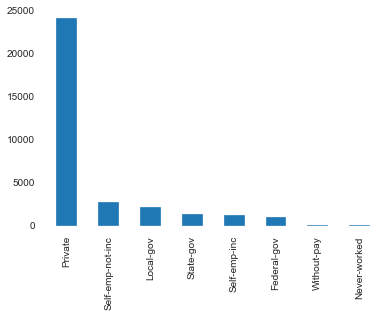

In [19]:
data["Sector where person works"].value_counts().plot.bar()

In [20]:
data['education'].value_counts()

HS-grad         10501
Some-college     7291
Bachelors        5355
Masters          1723
Assoc-voc        1382
11th             1175
Assoc-acdm       1067
10th              933
7th-8th           646
Prof-school       576
9th               514
12th              433
Doctorate         413
5th-6th           333
1st-4th           168
Preschool          51
Name: education, dtype: int64

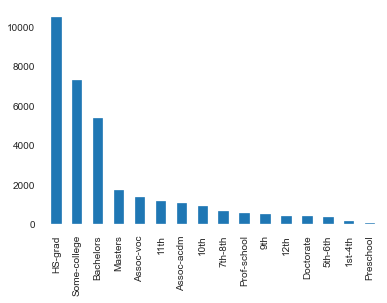

In [21]:
data['education'].value_counts().plot.bar()

In [22]:
data['marital.status'].value_counts()

Married-civ-spouse       14976
Never-married            10683
Divorced                  4443
Separated                 1025
Widowed                    993
Married-spouse-absent      418
Married-AF-spouse           23
Name: marital.status, dtype: int64

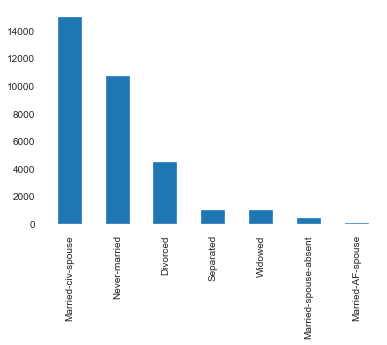

In [23]:
data['marital.status'].value_counts().plot.bar()

In [24]:
pd.pivot_table(data,index=['Sector where person works','marital.status','education'],
               values=['Defaulted in Last year','Amount of debt taken from bank','Debt to income Ratio','capital.gain','capital.loss'],
               aggfunc=np.sum,fill_value=0)
              

Amount of debt taken from bank  \
Sector where person works marital.status        education                                      
Federal-gov               Divorced              10th                                   14833   
                                                11th                                   17815   
                                                Assoc-acdm                             60235   
                                                Assoc-voc                              40865   
                                                Bachelors                             155179   
...                                                                                      ...   
Without-pay               Married-civ-spouse    HS-grad                                21238   
                                                Some-college                           13114   
                          Married-spouse-absent Some-college                            9102   
                          Never-married         HS-grad                                18224   
                          Widowed               7th-8th                                 1754   

                                                              Debt to income Ratio  \
Sector where person works marital.status        education                            
Federal-gov               Divorced              10th                      5.952736   
                                                11th                     56.950239   
                                                Assoc-acdm              113.211861   
                                                Assoc-voc               190.961572   
                                                Bachelors               370.878975   
...                                                                            ...   
Without-pay               Married-civ-spouse    HS-grad                 113.258238   
                                                Some-college             15.270027   
                          Married-spouse-absent Some-college             11.980140   
                          Never-married         HS-grad                  55.250722   
                          Widowed               7th-8th                   5.927802   

                                                              capital.gain  \
Sector where person works marital.status        education                    
Federal-gov               Divorced              10th                     0   
                                                11th                 14084   
                                                Assoc-acdm            4528   
                                                Assoc-voc             4934   
                                                Bachelors             5455   
...                                                                    ...   
Without-pay               Married-civ-spouse    HS-grad               4828   
                                                Some-college             0   
                          Married-spouse-absent Some-college             0   
                          Never-married         HS-grad               4416   
                          Widowed               7th-8th                  0   

                                                              capital.loss  
Sector where person works marital.status        education                   
Federal-gov               Divorced              10th                     0  
                                                11th                     0  
                                                Assoc-acdm            3821  
                                                Assoc-voc                0  
                                                Bachelors             2883  
...                                                                    ...  
Without-pay               Married-civ-spouse    HS-grad        

In [25]:
# We have put a pivot table at Living in  and Living at same address, default in last year DOB by which we can see 
# that person who Living at same address for minimum number is defaluter 


data2=pd.pivot_table(data,index=['Living in ','Living at same address','Defaulted in Last year','Date of Birth'],
               values=['Amount of debt taken from bank','Debt to income Ratio','capital.gain','capital.loss'],
               aggfunc=np.sum,fill_value=0)


top50 = pd.DataFrame(data2).head(50)
top50

Amount of debt taken from bank  \
Living in  Living at same address Defaulted in Last year Date of Birth                                   
Cambodia   1                      defaulted              32                                       2475   
           2                      defaulted              36                                       1579   
                                  not Defaulted          40                                       6362   
           4                      defaulted              27                                       5412   
                                                         35                                       8460   
           5                      defaulted              28                                       7090   
           6                      defaulted              25                                       5341   
           8                      defaulted              24                                       1495   
           9                      not Defaulted          27                                       3711   
           10                     not Defaulted          48                                       8573   
           14                     defaulted              40                                       4718   
           15                     defaulted              37                                       7608   
           18                     not Defaulted          42                                       2909   
           19                     defaulted              51                                       2562   
           20                     defaulted              65                                       7580   
           22                     defaulted              34                                       8705   
                                  not Defaulted          46                                       8565   
           26                     not Defaulted          37                                       4900   
           30                     defaulted              18                                       2024   
                                  not Defaulted          50                                       1610   
Canada     1                      defaulted              35                                       3330   
                                                         45                                       2210   
           2                      defaulted              20                                        649   
           3                      defaulted              30                                       1042   
                                                         38                                       4240   
                                                         73                                       8951   
           4                      defaulted              40                                       6732   
                                                         53                                       7718   
                                                         57                                       9790   
                                                         58                                        712   
                                  not Defaulted          31                                       1591   
           5                      defaulted              29                                       2571   
                                                         35                                       1972   
                                  not Defaulted          36                                       6875   
                                                         45                                       2582   
           6                      defaulted              17                                       9287   
                                            

In [26]:
data1=data.groupby(['Living in ','Living at same address','Defaulted in Last year','Date of Birth'])['Amount of debt taken from bank'].sum()\
            .groupby(['Living in ','Living at same address','Defaulted in Last year']).max().sort_values() \
            .groupby(['Living in ']).sum().sort_values(ascending = False)

top15 = pd.DataFrame(data1).head(50)
top15

,Amount of debt taken from bank
Living in,
United-States,7145606
Mexico,627156
Philippines,437836
Germany,337661
Canada,329400
India,307253
Puerto-Rico,297088
England,290111
Cuba,281180


# Multivariate analysis


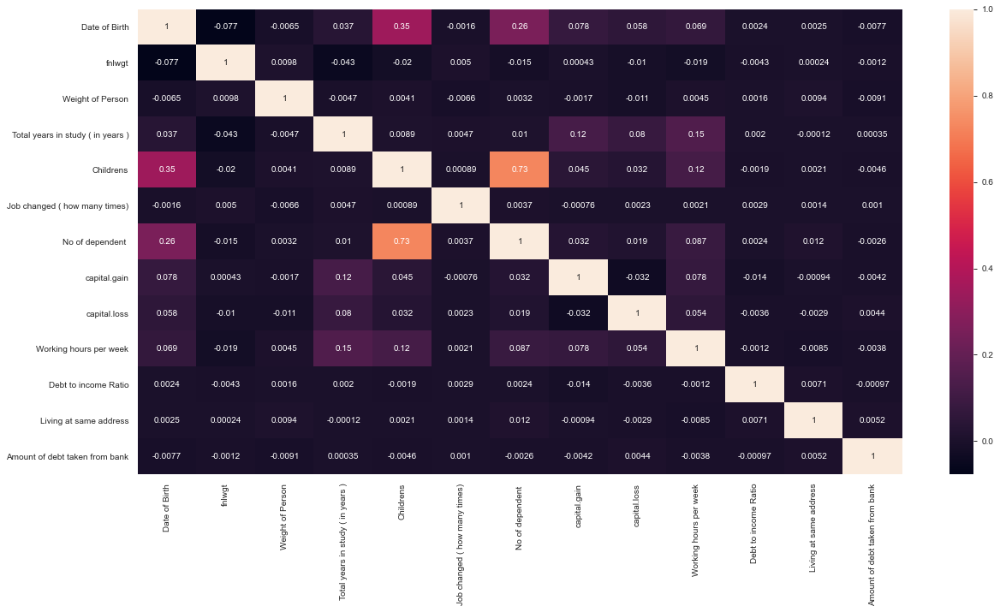

In [27]:
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),annot=True, fmt=".2g")

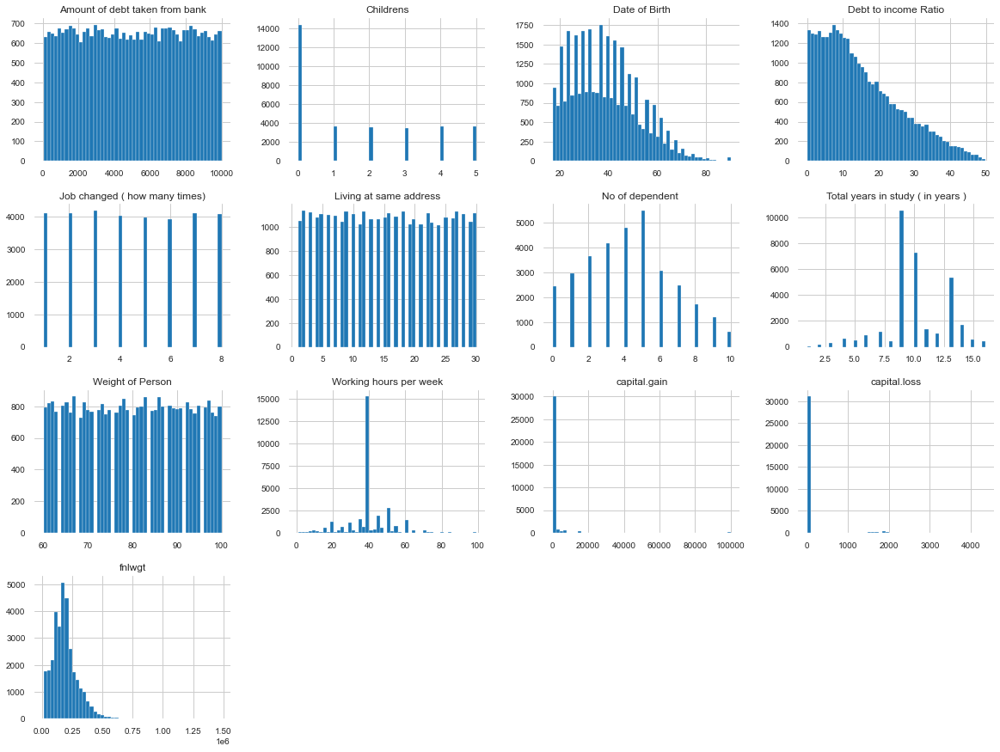

In [28]:
data.hist(bins=50,figsize=(20,15))
plt.show()

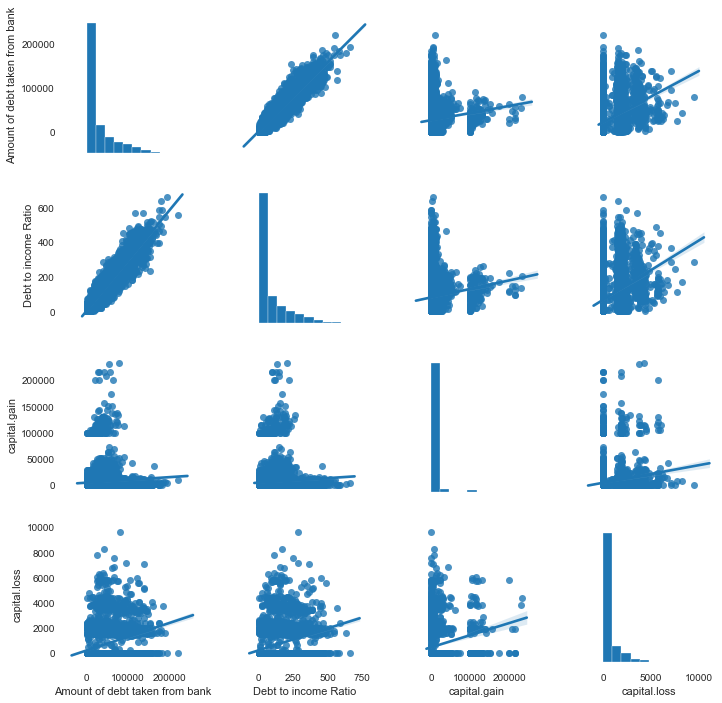

In [29]:
#Scatter plots
sns.pairplot(data2, kind='reg')
plt.show()

# 3. Multicollinearity 


In [30]:
#correlation matrix
corr_matrix=data.corr()
corr_matrix

,Date of Birth,fnlwgt,Weight of Person,Total years in study ( in years ),Childrens,Job changed ( how many times),No of dependent,capital.gain,capital.loss,Working hours per week,Debt to income Ratio,Living at same address,Amount of debt taken from bank
Date of Birth,1.000000,-0.076646,-0.006455,0.036527,0.347572,-0.001585,0.256075,0.077674,0.057775,0.068756,0.002429,0.002497,-0.007689
fnlwgt,-0.076646,1.000000,0.009800,-0.043195,-0.019574,0.005012,-0.015329,0.000432,-0.010252,-0.018768,-0.004292,0.000243,-0.001195
Weight of Person,-0.006455,0.009800,1.000000,-0.004704,0.004064,-0.006561,0.003205,-0.001728,-0.011218,0.004540,0.001649,0.009414,-0.009058
Total years in study ( in years ),0.036527,-0.043195,-0.004704,1.000000,0.008943,0.004697,0.010384,0.122630,0.079923,0.148123,0.001977,-0.000123,0.000353
Childrens,0.347572,-0.019574,0.004064,0.008943,1.000000,0.000893,0.729872,0.045298,0.031708,0.120764,-0.001863,0.002092,-0.004552
Job changed ( how many times),-0.001585,0.005012,-0.006561,0.004697,0.000893,1.000000,0.003703,-0.000755,0.002286,0.002127,0.002888,0.001443,0.001024
No of dependent,0.256075,-0.015329,0.003205,0.010384,0.729872,0.003703,1.000000,0.032403,0.019398,0.086599,0.002433,0.011705,-0.002648
capital.gain,0.077674,0.000432,-0.001728,0.122630,0.045298,-0.000755,0.032403,1.000000,-0.031615,0.078409,-0.013540,-0.000941,-0.004230
capital.loss,0.057775,-0.010252,-0.011218,0.079923,0.031708,0.002286,0.019398,-0.031615,1.000000,0.054256,-0.003584,-0.002926,0.004445
Working hours per week,0.068756,-0.018768,0.004540,0.148123,0.120764,0.002127,0.086599,0.078409,0.054256,1.000000,-0.001180,-0.008476,-0.003799


In [31]:
#correlation with Y='Amount of debt taken from bank' with other independent variable (close to +1 strong postive correlation and -1 close to shows negative corelation
# Close to '0' means no corelation )
corr_matrix['Amount of debt taken from bank'].sort_values(ascending=False)

Amount of debt taken from bank       1.000000
Living at same address               0.005199
capital.loss                         0.004445
Job changed ( how many times)        0.001024
Total years in study ( in years )    0.000353
Debt to income Ratio                -0.000968
fnlwgt                              -0.001195
No of dependent                     -0.002648
Working hours per week              -0.003799
capital.gain                        -0.004230
Childrens                           -0.004552
Date of Birth                       -0.007689
Weight of Person                    -0.009058
Name: Amount of debt taken from bank, dtype: float64

In [32]:
# let see how label Encoder help us to convert our categorical data 
from sklearn import preprocessing

In [33]:
label_encoder = preprocessing.LabelEncoder()
data['Sector where person works']= label_encoder.fit_transform(data['Sector where person works'])
data['education']= label_encoder.fit_transform(data['education'])
data['marital.status']= label_encoder.fit_transform(data['marital.status'])
data['occupation']= label_encoder.fit_transform(data['occupation'])
data['relationship']= label_encoder.fit_transform(data['relationship'])
data['race']= label_encoder.fit_transform(data['race'])
data['Gender']= label_encoder.fit_transform(data['Gender'])
data['Living in ']= label_encoder.fit_transform(data['Living in '])
data['Defaulted in Last year']= label_encoder.fit_transform(data['Defaulted in Last year'])


In [34]:
data.shape

(32561, 22)

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 22 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Date of Birth                      32561 non-null  int64  
 1   Sector where person works          32561 non-null  int32  
 2   fnlwgt                             32561 non-null  int64  
 3   Weight of Person                   32561 non-null  int64  
 4   education                          32561 non-null  int32  
 5   Total years in study ( in years )  32561 non-null  int64  
 6   marital.status                     32561 non-null  int32  
 7   Childrens                          32561 non-null  int64  
 8   Job changed ( how many times)      32561 non-null  float64
 9   No of dependent                    32561 non-null  int64  
 10  occupation                         32561 non-null  int32  
 11  relationship                       32561 non-null  int

In [36]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Date of Birth,32561.0,38.581647,13.640433,17.000000,28.000000,37.000000,48.000000,9.000000e+01
Sector where person works,32561.0,3.102607,1.136671,0.000000,3.000000,3.000000,3.000000,7.000000e+00
fnlwgt,32561.0,189778.366512,105549.977697,12285.000000,117827.000000,178356.000000,237051.000000,1.484705e+06
Weight of Person,32561.0,79.954670,11.833661,60.000000,70.000000,80.000000,90.000000,1.000000e+02
education,32561.0,10.298210,3.870264,0.000000,9.000000,11.000000,12.000000,1.500000e+01
Total years in study ( in years ),32561.0,10.080679,2.572720,1.000000,9.000000,10.000000,12.000000,1.600000e+01
marital.status,32561.0,2.611836,1.506222,0.000000,2.000000,2.000000,4.000000,6.000000e+00
Childrens,32561.0,1.672522,1.829202,0.000000,0.000000,1.000000,3.000000,5.000000e+00
Job changed ( how many times),32561.0,4.485734,2.300182,1.000000,2.000000,4.000000,7.000000,8.000000e+00
No of dependent,32561.0,4.166702,2.500547,0.000000,2.000000,4.000000,6.000000,1.000000e+01


In [37]:
#Declare the dependent variable and create your independent and dependent datasets
X = data.drop('Defaulted in Last year', axis=1).to_numpy()
Y = data['Defaulted in Last year'].to_numpy()

In [38]:
X.shape, Y.shape

((32561, 21), (32561,))

# Model development & Model validation


In [39]:
#Split into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test =train_test_split(X, Y, test_size=0.20)
X_train, X_valid, Y_train, Y_valid=train_test_split(X_train, Y_train)

In [40]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_valid=scaler.transform(X_valid)
X_test=scaler.transform(X_test)

# Logistic Regression

In [57]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

logreg = LogisticRegression()
logreg.fit(X_train, Y_train)
y_pred = logreg.predict(X_test)

print('Logistic Regression accuracy score with all the features: {0:0.4f}'. format(accuracy_score(Y_test, y_pred)))

C:\Users\Bhumihar Rakesh\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Logistic Regression accuracy score with all the features: 0.8220


In [54]:
from statsmodels.api import OLS
#Run model
#lm = sm.OLS(Y_train,X_train).fit()
#print(lm.summary())

# Random Forest

In [42]:
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from sklearn import*

In [43]:
clf=ensemble.RandomForestClassifier(random_state=0,n_estimators=100)
clf.fit(X_train,Y_train)
Y_pred=clf.predict(X_test)
metrics.accuracy_score(Y_test,Y_pred)

0.8547520343927529

# KNN

In [44]:
clf=neighbors.KNeighborsClassifier(n_neighbors=13)
clf.fit(X_train,Y_train)
Y_pred_train=clf.predict(X_train)
Y_pred_test=clf.predict(X_test)
print("train:",metrics.accuracy_score(Y_train,Y_pred_train))
print("test:",metrics.accuracy_score(Y_test,Y_pred_test))

train: 0.8433149058149059
test: 0.815599570090588


# Drived features & Feature Engineering


In [45]:
data.columns

Index(['Date of Birth', 'Sector where person works', 'fnlwgt',
       'Weight of Person', 'education', 'Total years in study ( in years )',
       'marital.status', 'Childrens', 'Job changed ( how many times)',
       'No of dependent ', 'occupation', 'relationship', 'race', 'Gender',
       'capital.gain', 'capital.loss', 'Working hours per week',
       'Debt to income Ratio', 'Living at same address', 'Living in ',
       'Defaulted in Last year', 'Amount of debt taken from bank'],
      dtype='object')

In [46]:
Feature_cols=['Date of Birth', 'Sector where person works','education', 'marital.status','No of dependent ', 'occupation', 'relationship','Gender',
       'capital.gain', 'capital.loss', 'Working hours per week', 'Debt to income Ratio', 'Living at same address', 'Living in ','Amount of debt taken from bank']

In [47]:
x1=data[Feature_cols]
y1=data['Defaulted in Last year']

In [48]:
x1.shape, y1.shape

((32561, 15), (32561,))

In [49]:
#Split into train and test
from sklearn.model_selection import train_test_split
x1_train, x1_test, y1_train, y1_test =train_test_split(x1, y1, test_size=0.20)
x1_train, x1_valid, y1_train, y1_valid=train_test_split(x1_train, y1_train)

In [53]:
#Run model
#lm = sm.OLS(Y_train,x1_train).fit()
#print(lm.summary())

R-squared	The coefficient of determination. A statistical measure of how well the regression line approximates the real data points

Adj. R-squared	The above value adjusted based on the number of observations and the degrees-of-freedom of the residuals

F-statistic	A measure how significant the fit is. The mean squared error of the model divided by the mean squared error of the residuals

Prob (F-statistic)	The probability that you would get the above statistic, given the null hypothesis that they are unrelated

Log-likelihood	The log of the likelihood function.

AIC	The Akaike Information Criterion. Adjusts the log-likelihood based on the number of observations and the complexity of the model.

BIC	The Bayesian Information Criterion. Similar to the AIC, but has a higher penalty for models with more parameters.

coef	The estimated value of the coefficient

std err	The basic standard error of the estimate of the coefficient. More sophisticated errors are also available.

t	The t-statistic value. This is a measure of how statistically significant the coefficient is.

P > |t|	P-value that the null-hypothesis that the coefficient = 0 is true. If it is less than the confidence level, often 0.05, it indicates that there is a statistically significant relationship between the term and the response.	

The lower and upper values of the 95% confidence interval

Omnibus/Prob(Omnibus) – a test of the skewness and kurtosis of the residual. We hope to see a value close to zero which would indicate normalcy. The Prob (Omnibus) performs a statistical test indicating the probability that the residuals are normally distributed. We hope to see something close to 1 here. In this case Omnibus is relatively High and the Prob (Omnibus) is relatively zero so the data is somewhat not normal distributed, but not altogether ideal.

Skew – a measure of data symmetry. We want to see something close to zero, indicating the residual distribution is normal. Note that this value also drives the Omnibus. This result has a small, and therefore good, skew.

Kurtosis – a measure of "peakiness", or curvature of the data. Higher peaks lead to greater Kurtosis. Greater Kurtosis can be interpreted as a tighter clustering of residuals around zero, implying a better model with few outliers.

Durbin-Watson – tests for homoscedasticity. We hope to have a value between 1 and 2. In this case, the data is too close.

Jarque-Bera (JB)/Prob(JB) – like the Omnibus test in that it tests both skew and kurtosis. We hope to see in this test a confirmation of the Omnibus test. In this case we do.

Condition Number – This test measures the sensitivity of a function's output as compared to its input. When we have multicollinearity, we can expect much higher fluctuations to small changes in the data, hence, we hope to see a relatively small number, something below 30. In this case we are well below 30, which we would expect given our model only has 15 variables and one is a constant.


# Logistic Regression

In [59]:
logreg = LogisticRegression()
logreg.fit(x1_train, y1_train)
y2_pred = logreg.predict(x1_test)

print('Logistic Regression accuracy score with all the features: {0:0.4f}'. format(accuracy_score(y1_test, y2_pred)))

C:\Users\Bhumihar Rakesh\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Logistic Regression accuracy score with all the features: 0.8013


# Random Forest

In [51]:
clf=ensemble.RandomForestClassifier(random_state=0,n_estimators=100)
clf.fit(x1_train,y1_train)
y1_pred=clf.predict(x1_test)
metrics.accuracy_score(y1_test,y1_pred)

0.8590511285122063

# KNN

In [52]:
clf=neighbors.KNeighborsClassifier(n_neighbors=11)
clf.fit(x1_train,y1_train)
y1_pred_train=clf.predict(x1_train)
y1_pred_test=clf.predict(x1_test)
print("train:",metrics.accuracy_score(y1_train,y1_pred_train))
print("test:",metrics.accuracy_score(y1_test,y1_pred_test))

train: 0.8227375102375102
test: 0.8011668969752802


# Stacking Ensemble Machine Learning

In [67]:
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from matplotlib import pyplot
 
# get the dataset
def get_dataset():
    x1, y1 = make_classification(n_samples=2000, n_features=20, n_informative=15, n_redundant=5, random_state=1)
    return x1, y1

In [68]:
# get a list of models to evaluate
def get_models():
    models = dict()
    models['lr'] = LogisticRegression()
    models['knn'] = KNeighborsClassifier()
    models['cart'] = DecisionTreeClassifier()
    return models

In [69]:
# evaluate a given model using cross-validation
def evaluate_model(model, x1, y1):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, x1, y1, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

>lr 0.867 (0.030)
>knn 0.936 (0.017)
>cart 0.837 (0.032)


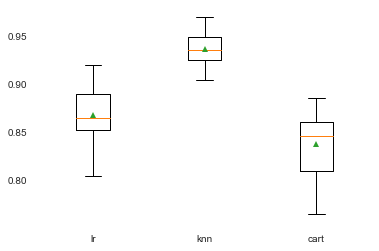

In [70]:
# define dataset
x1, y1 = get_dataset()
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, x1, y1)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()

# We can see that in this case, KNN performs the best with about 93.6 percent mean accuracy.
A box-and-whisker plot is then created comparing the distribution accuracy scores for each model,
allowing us to clearly see that KNN perform better on average than LR and CART

# To Get the loan back to bank account we must track the below feature:

1. Date of Birth 
2. Sector where person works
3. education
4. marital.status
5. Living in 